In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image
import matplotlib.pylab as plt

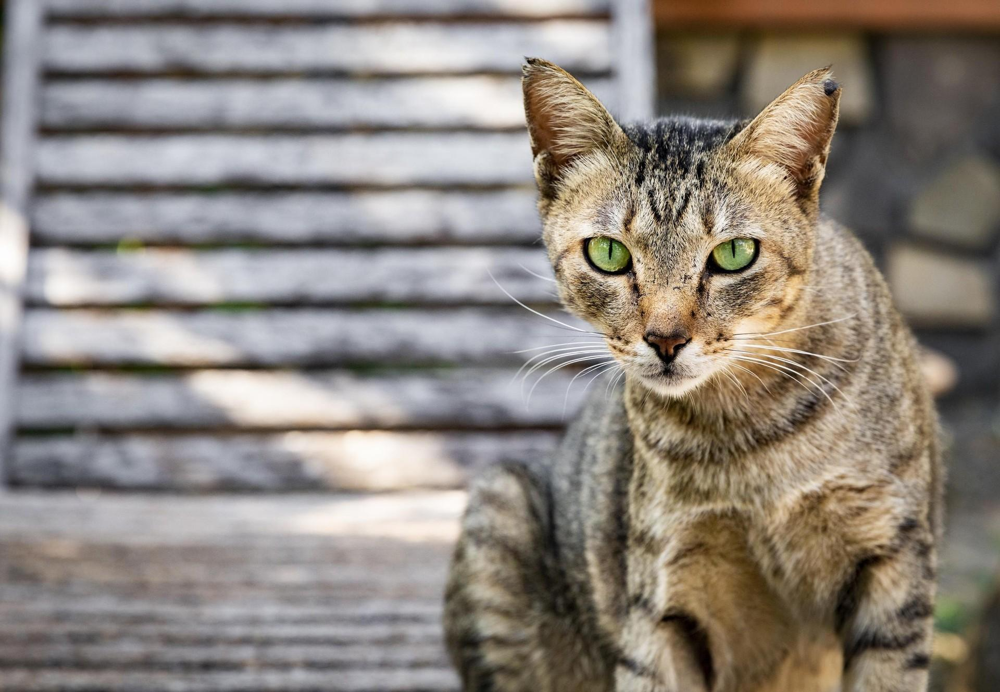

In [ ]:
url = 'https://media.4-paws.org/5/b/4/b/5b4b5a91dd9443fa1785ee7fca66850e06dcc7f9/VIER%20PFOTEN_2019-12-13_209-2890x2000-1920x1329.jpg'
image = io.imread(url)
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
cv2_imshow(image_2 )

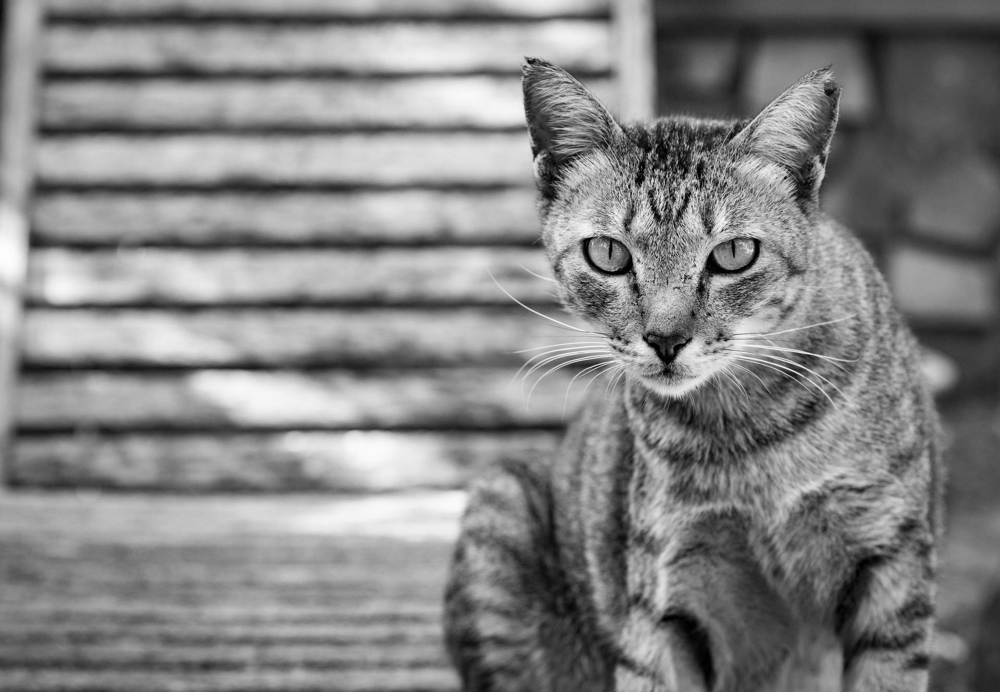

In [ ]:
image_3 = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(image_3)

In [ ]:
b = image_2.copy()
# set green and red channels to 0
b[:, :, 1] = 0
b[:, :, 2] = 0


g = image_2.copy()
# set blue and red channels to 0
g[:, :, 0] = 0
g[:, :, 2] = 0

r = image_2.copy()
# set blue and green channels to 0
r[:, :, 0] = 0
r[:, :, 1] = 0




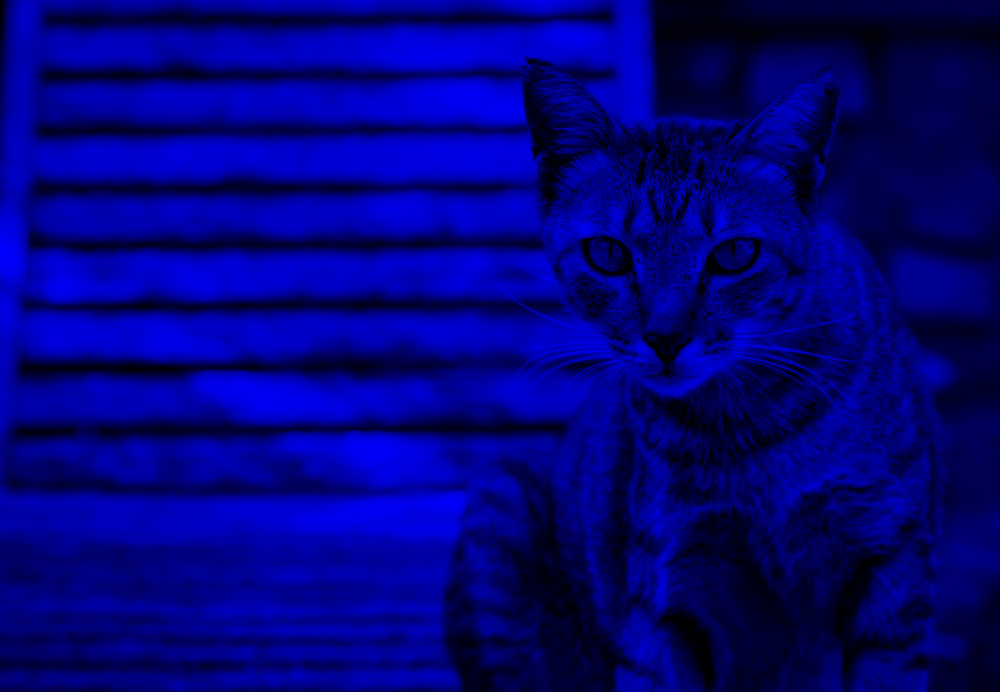

In [ ]:
cv2_imshow(b)

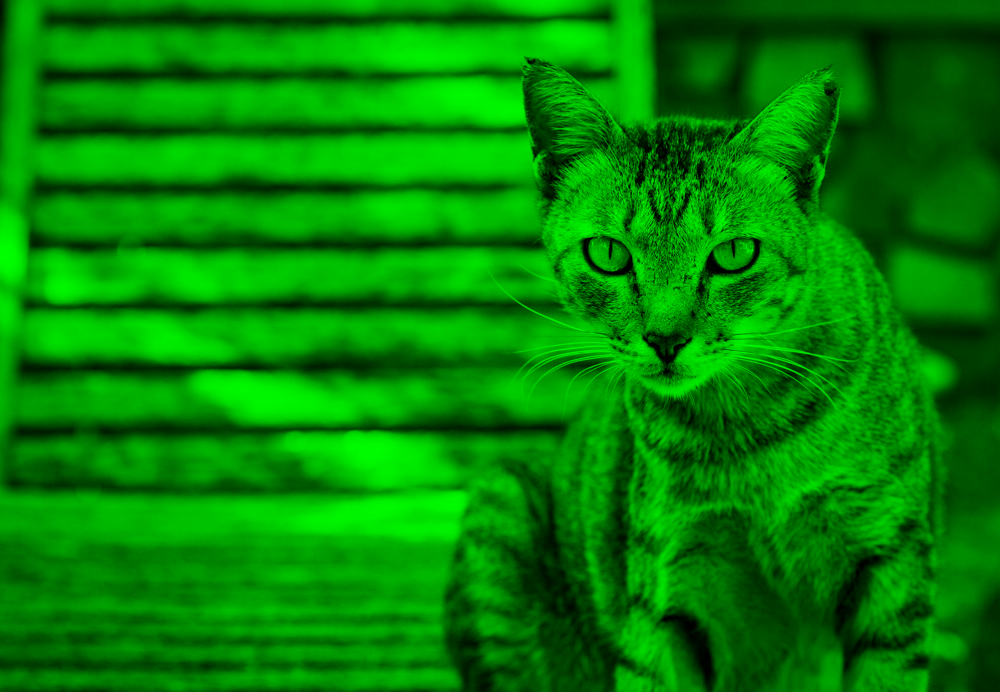

In [ ]:
cv2_imshow(g)



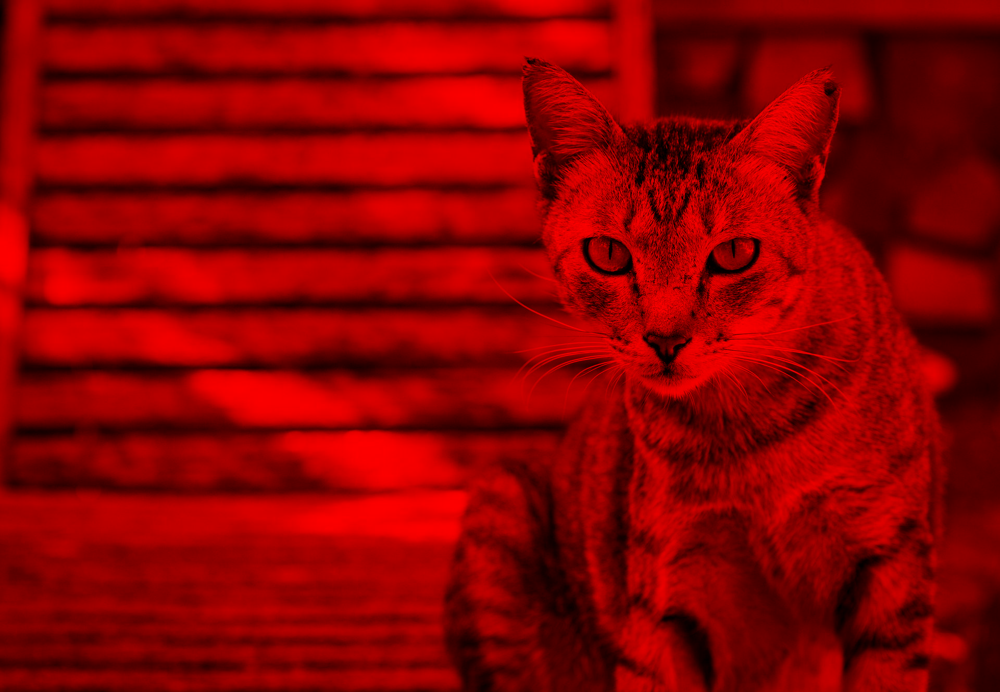

In [ ]:
cv2_imshow(r)

In [ ]:
url = 'https://datacarpentry.org/image-processing/data/plant-seedling.jpg'

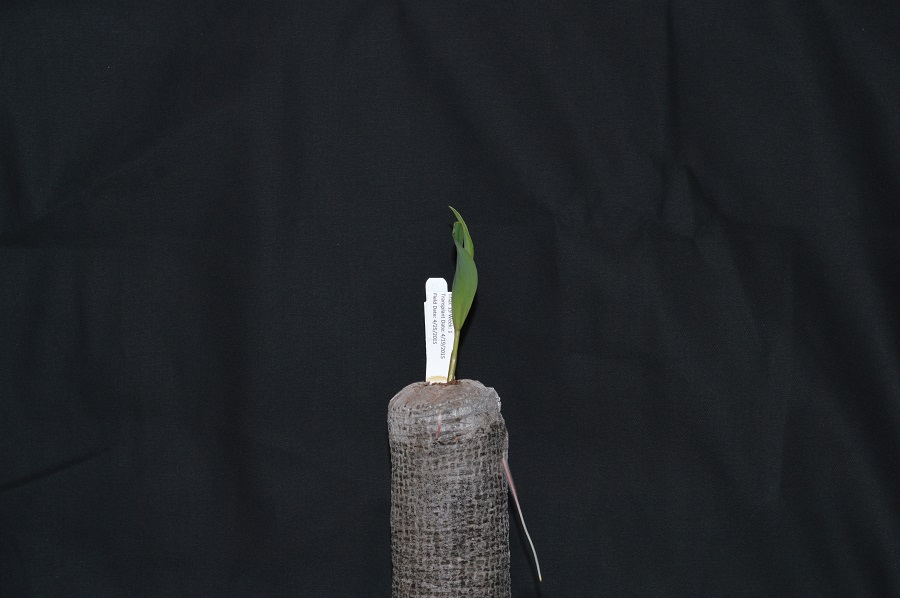

In [ ]:
image = io.imread(url)
image_4 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
cv2_imshow(image_4)

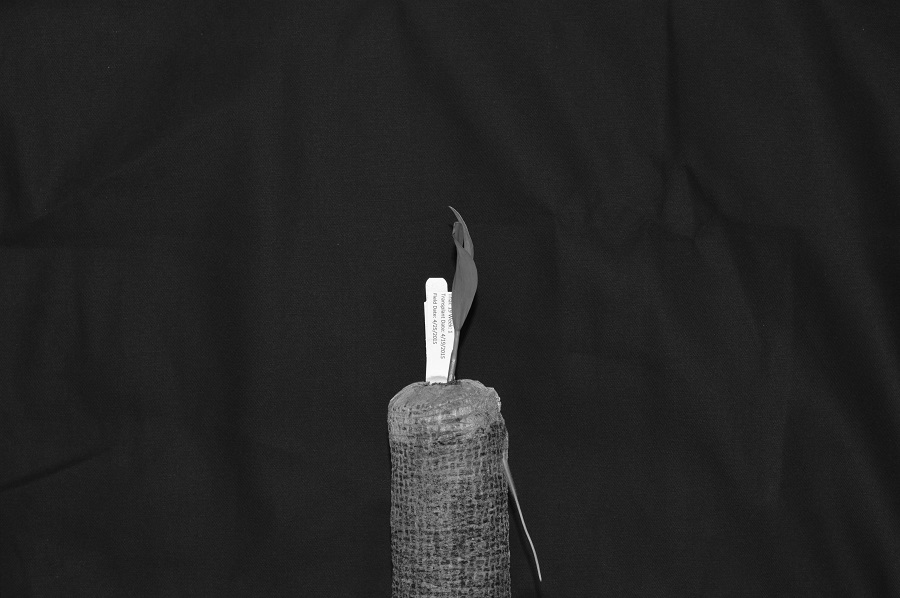

In [ ]:
image_4 = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(image_4)

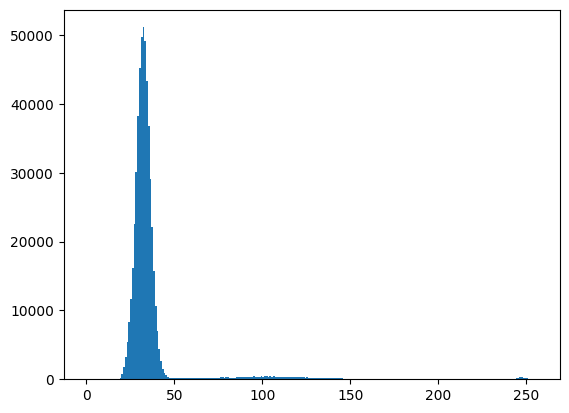

In [ ]:
plt.hist(image_4.ravel(), 256, [0, 256])
plt.show()

In [ ]:
image_4

array([[26, 25, 22, ..., 25, 25, 25],
       [25, 25, 23, ..., 26, 25, 25],
       [25, 26, 25, ..., 27, 26, 25],
       ...,
       [21, 26, 27, ..., 30, 24, 32],
       [22, 26, 26, ..., 29, 24, 30],
       [23, 26, 25, ..., 23, 31, 24]], dtype=uint8)

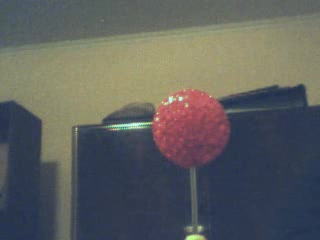

In [ ]:
url = 'http://mechanoid.su/content/cv-base.html/pix/ball2.jpg'
image = io.imread(url)
image_6 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
cv2_imshow(image_6)

In [ ]:
#autolevels
def autolevels(img):
  min = np.min(img)
  max = np.max(img)
  new_img = (img - min)/(255/(max-min))
  return new_img

In [ ]:
image_6_auto = autolevels(image_6)


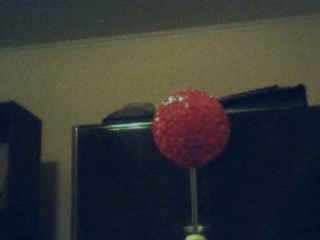

In [ ]:
cv2_imshow(image_6_auto)

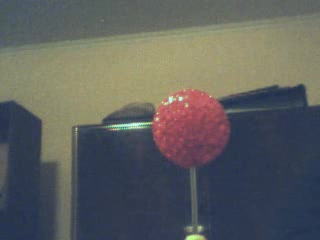

In [ ]:
image_6 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
cv2_imshow(image_6)

In [ ]:
image_6_auto = autolevels(image_6)

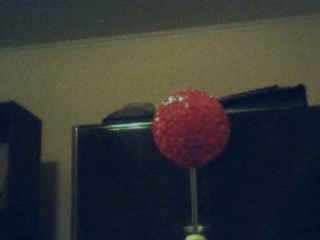

In [ ]:
cv2_imshow(image_6_auto)

In [ ]:
def gamma(img, gamma):
    return (img / 255.0) ** gamma * 255
gamma_img = gamma(image_6, 0.5)

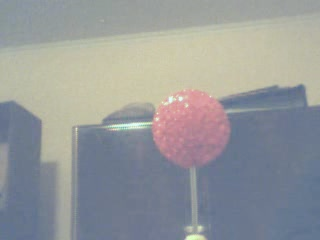

In [ ]:
cv2_imshow(gamma_img)

In [ ]:
gamma2 = gamma(image_6, 3)

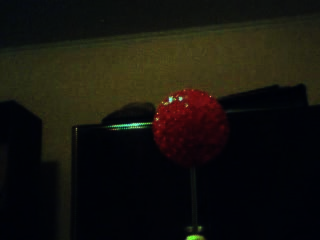

In [ ]:
cv2_imshow(gamma2)

With the use of open CV library make the next changes on the image
<br> + make binary image
<br> + blurring
<br> + edge detection (https://en.wikipedia.org/wiki/Edge_detection)
<bt> + image rotation
<br> + image scalling
<br> + 3 more options not listed in this notebook



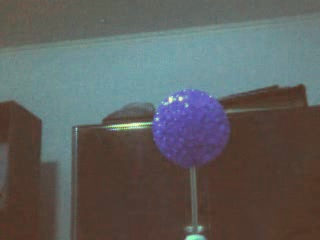

In [ ]:
cv2_imshow(image)

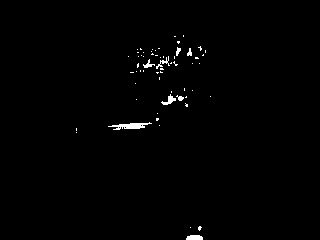

In [ ]:
# make binary image
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
# cv2_imshow(gray)
threshold, thresh = cv.threshold(gray, 150, 255, cv.THRESH_BINARY) # threshold value = 150
cv2_imshow(thresh)

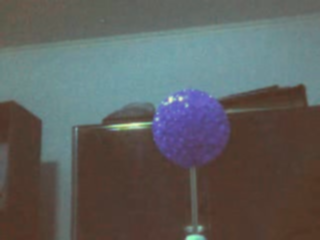

In [ ]:
# blurring
blur = cv.GaussianBlur(image, (3,3), 0)
cv2_imshow(blur)

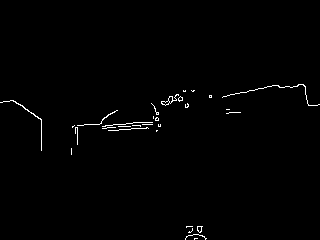

In [ ]:
# edge detection
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
canny = cv.Canny(gray, 150, 175)
cv2_imshow(canny)

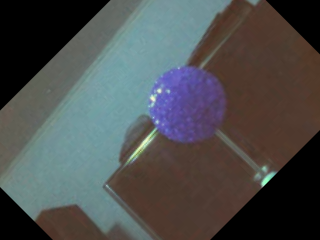

In [ ]:
# image rotation
(h, w) = image.shape[:2]
center = (w // 2, h // 2)
rotation_matrix = cv.getRotationMatrix2D(center, 45, 1.0)
rotated_image = cv.warpAffine(image, rotation_matrix, (w, h))
cv2_imshow(rotated_image)

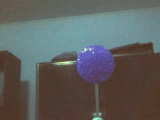

In [ ]:
# image scalling
def rescaleIMG(frame, scale=0.5):
    width = int(frame.shape[1] * scale)
    height = int(frame.shape[0] * scale)

    dimensions = (width, height)

    return cv.resize(frame, dimensions, interpolation=cv.INTER_AREA)

rescaled_image = rescaleIMG(image)
cv2_imshow(rescaled_image)

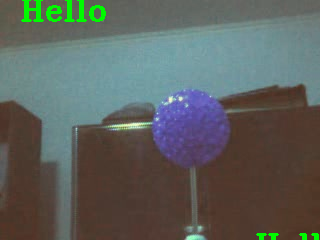

In [ ]:
cv.putText(image, 'Hello', (20,20), cv.FONT_HERSHEY_TRIPLEX, 1.0, (0,250,0), thickness=2)
cv2_imshow(image)

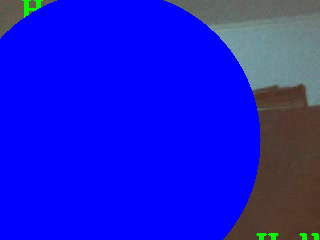

In [ ]:
mask = cv.circle(image, (image.shape[1]//2-50, image.shape[0]//2+20), 150, 255, -1)
cv2_imshow(mask)

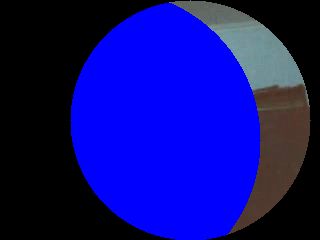

In [ ]:
blank = np.zeros(image.shape[:2], dtype='uint8')
# cv2_imshow(blank)
mask = cv.circle(blank, (image.shape[1]//2+30, image.shape[0]//2), 120, 255, -1)
# cv2_imshow(mask)
masked = cv.bitwise_and(image, image, mask=mask)
cv2_imshow(masked)